# Week 5 - 27.02.2024

## Part 1: Exploratory data visualzation, two variables
I told you how I love the Data Analysis with Open Source Tools book. You had to read Chapter 3, which is about visualizing data with two variables, before coming to class today. If you haven't yet, this is the time to do it!

Reading: DAOST Chapter 3 up to Graphical Analysis and Presentation Graphics on page 68 in the PDF. You can find it on Teams in the files tab.

And now a few exercises to reflect on the text:

*Exercise:* Questions from DAOST Chapter 3. Read the text and answer the questions to make sure you get it. No need for LLMs here

**Looking at Fig 3-1, Janert writes "the data itself shows clearly that the amount of random noise in the data is small". What do you think his argument is?**

The plot seem to figure a smooth curve with multiple polynomials ... it seems like it could be desvribed by a function for a harmonic oscilator losing energi.

**Can you think of a real-world example of a multivariate relationship like the one in Fig 3-3 (lower right panel)?**

Maybe if you plot two types of datasets in the same plot, like running times for men/women or your training data sets for two different time periods.

Or could be lowest and highest heartrate for a person during the day for each hour. When sleeping the low/high heart rate may be almost the same, but during the day and when exercising, there will be a higher difference.

Or, it could be showing dataset for two scenarious, one when you do exercise, one when you do not, or other case when something "happens" at one point, that may split the data in two different scenarios. 

**What are the two methods Janert metions for smoothing noisy data? Can you think of other ones?**

1. Splines: Piecewise polynomial functions, smoothening locally. Optimizing a function globally, with a "Wiggly" term with a second derivative (how much does it curve?) and a second term with square deviation - we want to keep the datapoints from deviating too much. *Overall smothness goal.*

2. LOESS:  Locally approximating to a (first-order preferably) polynomial, *a+bx*.

**What are residuals? Why is it a good idea to plot the residuals of your fit?**

   The residuals is the reminder after you have substracted the smooth trendline from your data - hence the difference. If the smooth line is a good fit, the residuals should be symmetrically distributed around 0.
   
**Explain in your own words the point of the smooth tube in figure 3-7.**
The "tube" shows a fitted curve fitting the data, and a lower/upper fit, fitting the data that is below/above the fit, hence where the residuals are either negative (lower fit) or positive (upper fit).


**What the h#ll is banking and what part of our visual system does it use to help us see patterns? What are potential problems with banking?**

Banking is not affecting the data, but instead scaling the plot by either changing the range we look at or squizing or stretching the plot to see details, soch as comparing slopes, better. It is easier to see change of slopes when the are close to 45 degrees, rather than being almost vertical or horisontal. 

When manipulating the view of data like that, a problem might be, that other parts of the visual will be distorted. For example if we squeeze the graph, like in the example with the sunspots, then it will be less obvious that the amount of sunspots are higher in the recent years.

**Summarize the discussion of Graphical Analysis and Presentation Graphics on pp. 68-69 in your own words.**

Basically, the graph should be as selfexplanatory as possible, labels should be readable and fonts pleasent for the presentation. Scaling and transformation should be done in order to present the graph as understandable (especially relating to the point that you want to give across) as possible. Name the axis, the graphs, and write the labels where they don't disturn the graph. Proofread and chose the right image format before publishing.




*Exercise 2.2:* Logarithms and logarithmic plots.

First, a couple of questions:

**What kind of relationships will a semi-log plot help you discover? *(First think, use your brain to answer, then it's OK to get further inspiration from your LLM. The same goes for the next little question.)***

The log plot will help us see exponential relations, such as $y = e^x$ where y is an exponential function of x. It could be when looking at distances to the nearest planets, then stars, then galaxies ... 

**What kind of functions will loglog plots help you see?**

Log-log plots will show relations that follow a power law, where both variables x and y will be affected largely with a small change in the other variable. An example of this is what we saw with the size vs heartrate of a mammal. A small positive change is size of the mammal will give a great fall in heartrate, but also a small reduction in the heart rate indicates a mucgh larger animal.

Another example is the initial mass distrubution of stars. There are exponentially many more stars with low mass, but fewer large mass stars. There are a few extremely massive stars. Both the mass and the amount can be best seen on a logarithmic scale.

**Second, create a version of this plot from Week 1, where you display the y-axis on log-scale. Comment on what the plot looks like. Do any new insights arise?**



In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
from scipy.stats import norm
import matplotlib.pyplot as plt

df = pd.read_csv("../files/Police_Department_Incident_Reports__Historical_2003_to_May_2018_20240130.csv")
#df.head()

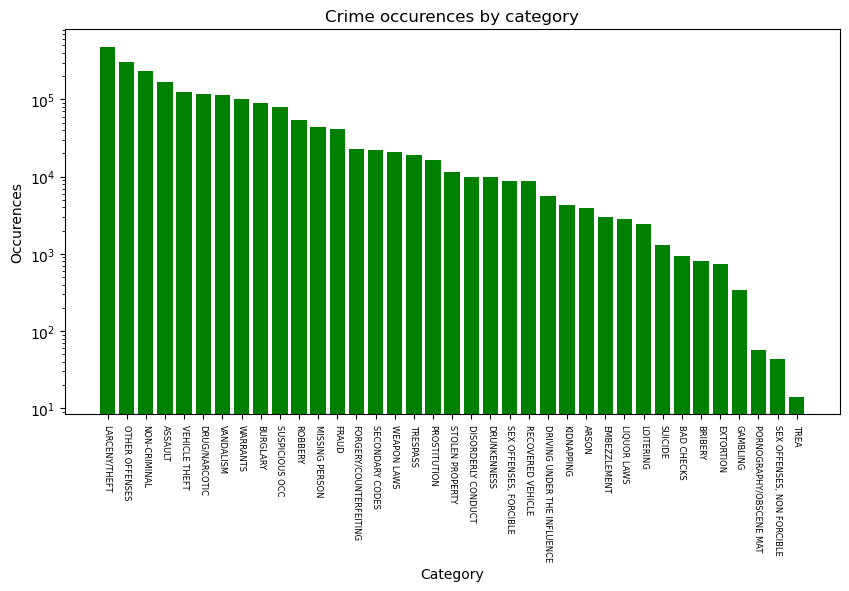

In [3]:
cats = df["Category"].value_counts().index.tolist()
occ = df["Category"].value_counts().tolist()

plt.rcParams["figure.figsize"] = (10, 5)
#plt.figsize(10,5)

plt.bar(cats, occ, color = 'green')
plt.title("Crime occurences by category")
plt.xlabel("Category")
plt.ylabel("Occurences")
plt.yscale("log") 

plt.xticks(rotation=270, size=6)

plt.show()

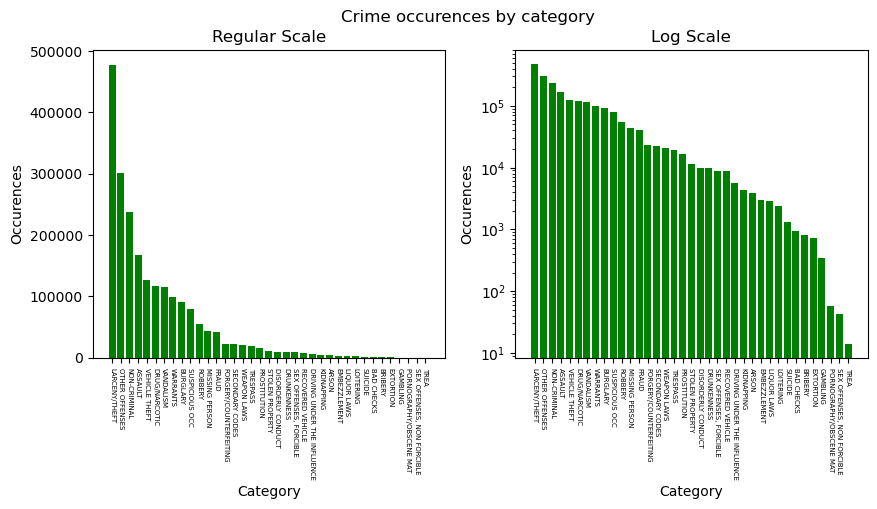

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4)) 
fig.suptitle("Crime occurences by category")


# First subplot without log scale
axes[0].bar(cats, occ, color='green')
axes[0].set_title("Regular Scale")
axes[0].set_xlabel("Category")
axes[0].set_ylabel("Occurences")
axes[0].tick_params(axis='x', rotation=270, labelsize=5)

# Second subplot with log scale
axes[1].bar(cats, occ, color='green')
axes[1].set_title("Log Scale")
axes[1].set_xlabel("Category")
axes[1].set_ylabel("Occurences")
axes[1].set_yscale("log")
axes[1].tick_params(axis='x', rotation=270, labelsize=5)

plt.show()

The plot of occurences by category in log scale on the y-axis now show or more linear declination, meaning that as we move through the categories towards lesser frequency of occurences, the occurencies fall exponentionally. When the scale was non-log, the scaling was dominated by the largest occurencies and it was hard to see the differences in the less occuring crimes. In this new scale. it is easier to compare the occurences in the less occuring crimes. 

Also, the 3 least accuring crimes, Porno/Obsene Mat, Sex.offences Non-forcibles and Trea seem to be ultra rare, not even following the exponential decline, but still on log scale falling drastically.



**Third, let's also try a loglog plot. Inspired by this article I would expect that especially theft could be characterized by a power law distribution also in San Francisco. Let's see if I'm right. It's OK use LLMs as much as you can for this one**

- Step 1: Divide San Francisco into a grid roughly 
$100m \times 100m$. You can, for example use numpy to do this, I would call np.histogram2d, and searching the internet, it seems that there are also ways to do this in pandas. The earth isn't flat,so lat, lon aren't really squares, but it is OK to ignore.
    - Hint 1. I really mean approximately 100 meters. It can also be 200 meters. Or 80 meters. Or 300.
    - Hint 2. Ignore outliers. We only want points that are on the SF peninsula
    - Hint 3. We've made a little example of how you can do the binning. Get it here.
    - Hint 4. Ask your LLM.
- Step 2: Count the number of thefts occurring within each grid-square (use all data for all time).
- Step 3: Tally the counts. Count the number of squares with $k=0$ thefts. We call this $N(0)$. Next, count the number of grids with one crime to get $N(k=1)$. Keep going like this all the way up to $k=C_{max}$, where $k=C_{max}$ is the highest count of crimes you find in any grid space.
    - Extra tip: If you want all the details on binning for loglog axes, you can check out Lecture 2, Part 3 in my social graphs course.


In [53]:
#df['Y'] >= df['Y'].min()
X_diff = df['X'].max() - df[df['X']!= -120.5]['X'].min()
print(f"X-diff: {X_diff}")

Y_diff = df[df['Y']!=90]['Y'].max() - df['Y'].min()
print(f"Y-diff: {Y_diff}")

X-diff: 2.0136420642899964
Y-diff: 0.1127418156566975


In [61]:
#df["Category"].unique()
df_thefts = df[(df["Category"] == "VEHICLE THEFT") | (df["Category"] == "LARCENY/THEFT")]

In [78]:
# X longitude and Y latitude
# Filter the DataFrame for points within San Francisco's peninsula
sf_df = df_thefts[(df_thefts['X'] >= df_thefts[df_thefts['X']!= -120.5]['X'].min()) & (df_thefts['X'] <= df_thefts['X'].max()) 
           & (df_thefts['Y'] >= df_thefts['Y'].min()) & (df_thefts['Y'] <= df_thefts[df_thefts['Y']!=90]['Y'].max()) ] 


# Conversion to size in Meters to bins from the degrees. 
# Generally, one degree of latitude is approximately 111 kilometers (or 111,000 meters).

# At a latitude of approximately 37 degrees, one degree of longitude is about 88,904 meters. 
# This means that at the latitude near San Francisco, one degree of longitude is roughly 88.9 kilometers.

# So, approx. 100,000 meters for each degree. 
# X is 2.0 degrees, so 200,000 meters total = 2000 X 100 m
# Y is 0.1 degrees, so 10,000 meters total = 100 x 100 m

# Create the grid
hist, xedges, yedges = np.histogram2d(sf_df['X'], sf_df['Y'], bins=(2000, 100))

# Flatten the histogram to get the count of thefts in each cell
grid_counts = hist.flatten()

# Count the frequency of each theft count
# unique contains the distinct counts of thefts in the cells (i.e., different values of k).
# counts is the frequency of each of these counts (i.e., N(k) for each k). 
# This tells you how many cells have k=0 thefts (N(0)), how many have k=1 theft (N(k=1)), 
# and so on, up to the maximum count of thefts found in any cell.
unique, counts = np.unique(grid_counts, return_counts=True)

# Prepare for log-log plot
# Filter out the 0s for log scale
non_zero_indices = unique > 0
unique = unique[non_zero_indices]
counts = counts[non_zero_indices]

# Create log-log plot
#plt.figure(figsize=(8, 6))
#plt.loglog(unique, counts, marker='o', linestyle='none')
#plt.title('Log-Log plot of Theft Incidents in San Francisco')
#plt.xlabel('Number of Thefts per Cell (100m x 100m)')
#plt.ylabel('Frequency')
#plt.grid(True)
#plt.show()


#### X-Axis (Horizontal Axis): 
Represents the 'Number of Thefts per Cell'. Each cell refers to a small geographic area determined by the grid you created over San Francisco. The size of each cell is approximately 100m x 100m, based on the conversion from degrees to meters (considering that one degree of latitude is about 111 kilometers and one degree of longitude is about 88.9 kilometers at San Francisco's latitude).

#### Y-Axis (Vertical Axis): 
Shows the 'Frequency', which is how often a particular number of thefts occurs in these cells. *For example, **if the frequency of '5' is '10', it means that there are 10 cells in the city where exactly 5 thefts occurred.***

= if the frequency of 100 is 1000, it means that there are 1000 cells where 100 thefts occured

- Step 4: Plot the distribution of $k + 1$ vs $N(k)$ on linear axes.

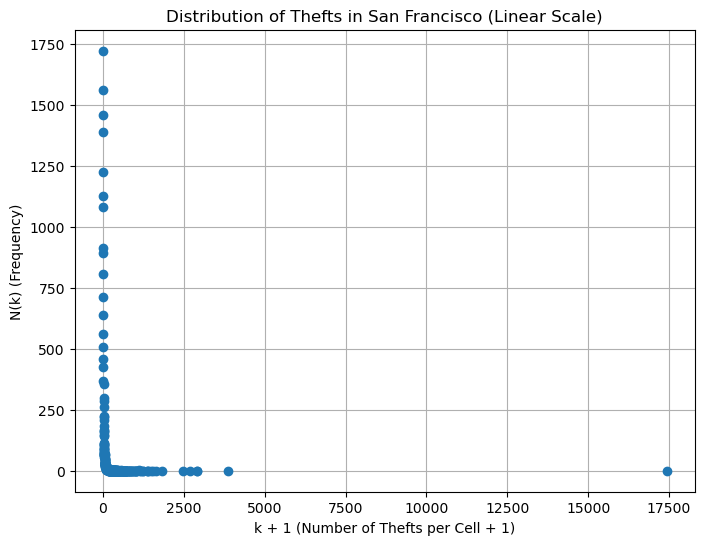

In [79]:
plt.figure(figsize=(8, 6))
plt.plot(unique + 1, counts, marker='o', linestyle='none')  # k + 1 on the x-axis, N(k) on the y-axis
plt.xlabel('k + 1 (Number of Thefts per Cell + 1)')
plt.ylabel('N(k) (Frequency)')
plt.title('Distribution of Thefts in San Francisco (Linear Scale)')
plt.grid(True)
plt.show()

- Step 5: Plot the distribution of of $k + 1$ vs $N(k)$ on loglog axes.

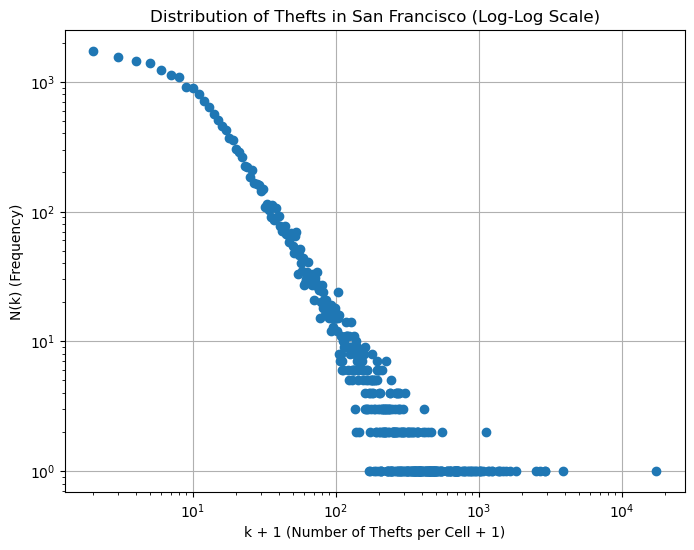

In [80]:
plt.figure(figsize=(8, 6))
plt.loglog(unique + 1, counts, marker='o', linestyle='none')  # Log-log scale
plt.xlabel('k + 1 (Number of Thefts per Cell + 1)')
plt.ylabel('N(k) (Frequency)')
plt.title('Distribution of Thefts in San Francisco (Log-Log Scale)')
plt.grid(True)
plt.show()

- Step 6: Answer the question. Was Sune correct in assuming that there is a power-law distribution of theft?

Yes, Sune is absolutely correct, this is a power-low distribution, with exponentionaly high amount of low occurencies per cell and exponentionaly low frequency of high occurencies per cell.

## Part 2: Linear Regression

So, now it's time for fun with standard linear regression! We'll get into that by asking the following question. 

> *Which pair of focus crimes have the the most similar temporal pattern across the week? (And which pair is most dissimilar).*

(It's OK to use your LLM for all aspects of this one.)

Below I list the focus-crimes for your convenience

In [81]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])


One way to answer this question is to plot the activity for all pairs of crimetypes as scatter plot per pair. One crime type on each axis, and where each point in the scatter corresponds to an hour of the week, and the number of crimes of crime-type 1 is on the x-axis and the number of crimes of crime-type 2 is on the y-axis. (So there will be 168 points in each scatterplot.) If we look at 14 focus crimes that results in 91 pairwise comparisons.

Exercise: Create the 91 scatterplots.


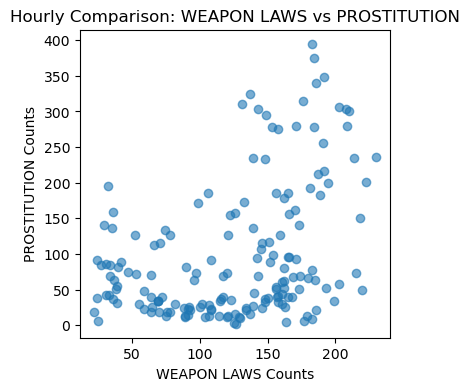

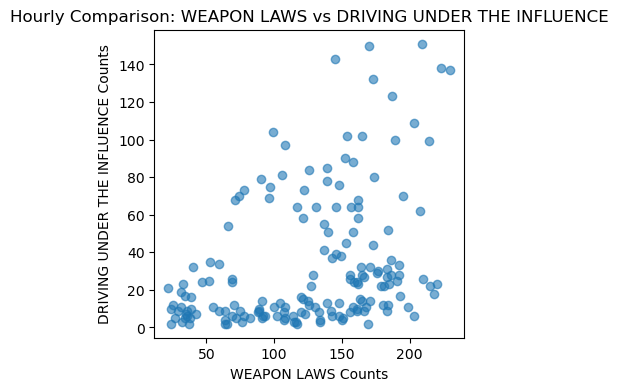

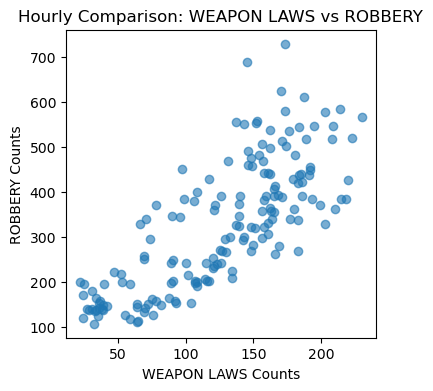

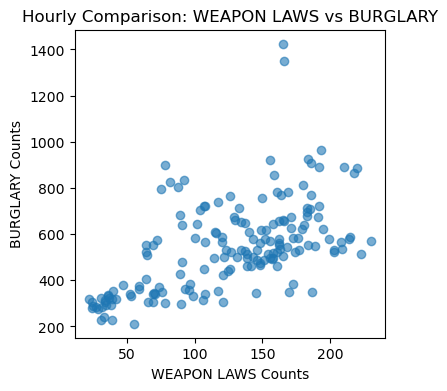

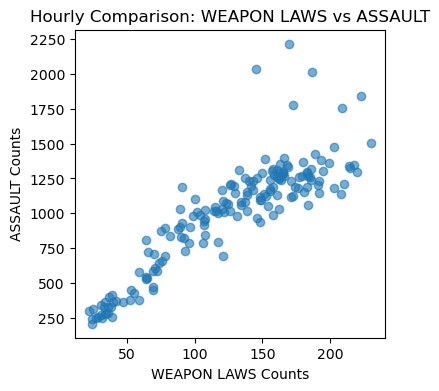

...

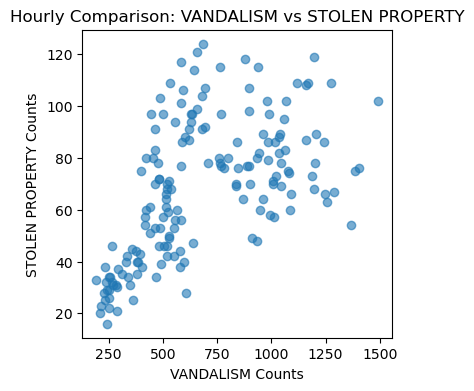

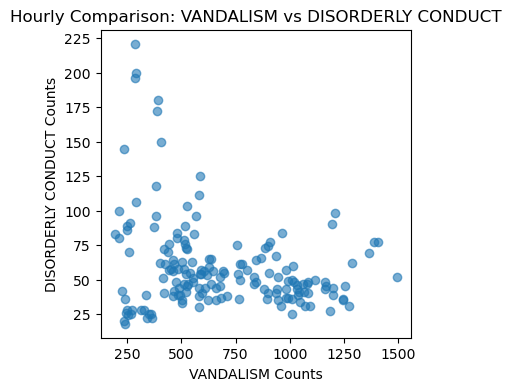

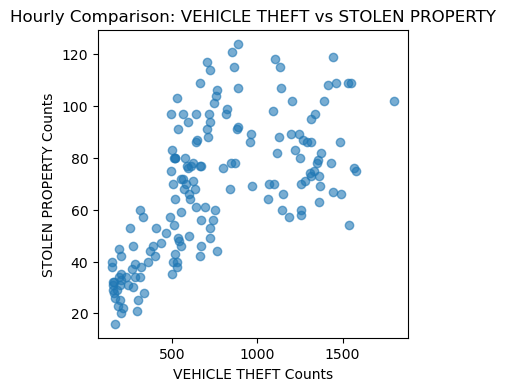

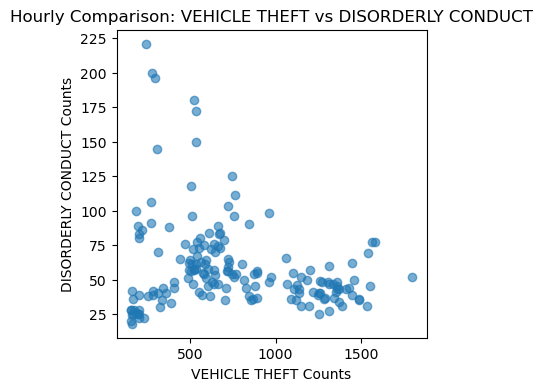

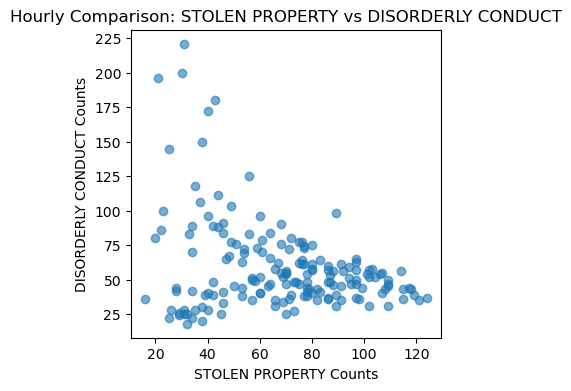

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import itertools

# Assuming df is your DataFrame with 'Date' and 'Time' columns
# Combine 'Date' and 'Time' into a single 'DateTime' column
df['DateTime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], format='%m/%d/%Y %H:%M')

# Convert 'DateTime' to hour of the week (0-167)
df['HourOfWeek'] = df['DateTime'].dt.dayofweek * 24 + df['DateTime'].dt.hour

# Aggregate data
hourly_counts = df.groupby(['Category', 'HourOfWeek']).size().unstack(fill_value=0)

# Focus crimes list
focuscrimes = ['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']

# Generate all pairs of focus crimes
pairs = list(itertools.combinations(focuscrimes, 2))

# Create scatter plots for each pair
for crime1, crime2 in pairs:
    plt.figure(figsize=(4, 4))
    plt.scatter(hourly_counts.loc[crime1], hourly_counts.loc[crime2], alpha=0.6)
    plt.xlabel(f'{crime1} Counts')
    plt.ylabel(f'{crime2} Counts')
    plt.title(f'Hourly Comparison: {crime1} vs {crime2}')
    plt.show()


Great! I would like the plots to be written as subplots in a 23 rows of 4 plots in each (asking Code Tutor)

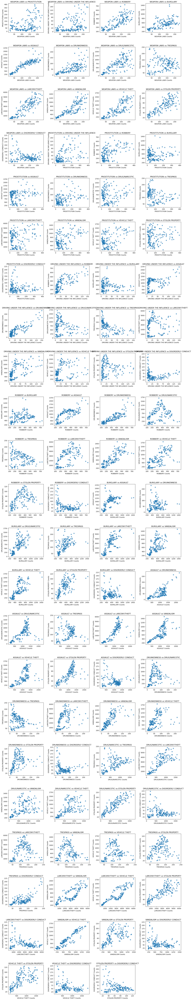

In [90]:
import matplotlib.pyplot as plt
import itertools
import math

# Focus crimes list
focuscrimes = ['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']
pairs = list(itertools.combinations(focuscrimes, 2))

# Create a large figure to hold all subplots
fig, axes = plt.subplots(nrows=23, ncols=4, figsize=(20, 115)) # Adjust figsize as needed
fig.subplots_adjust(hspace=0.5, wspace=0.3) # Adjust spacing as needed

# Plot each pair in its subplot
for i, (crime1, crime2) in enumerate(pairs):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    ax.scatter(hourly_counts.loc[crime1], hourly_counts.loc[crime2], alpha=0.6)
    ax.set_xlabel(f'{crime1} Counts')
    ax.set_ylabel(f'{crime2} Counts')
    ax.set_title(f'{crime1} vs {crime2}')

# Hide any unused subplots
for j in range(i+1, 23*4):
    axes[j // 4, j % 4].axis('off')

plt.show()


Display the plots in a 7 by 13 subplot matrix. You can use matplotlib's subplot to organize those plots. With  7 across and 13 down, you should be able to squeeze them all onto a single a4 page.
- Make sure to label each one with the two crime-types you're comparing so we can easily inspect visually.
- Make sure that that you squeeze the subplots closely together so each plot can be as big as possible.

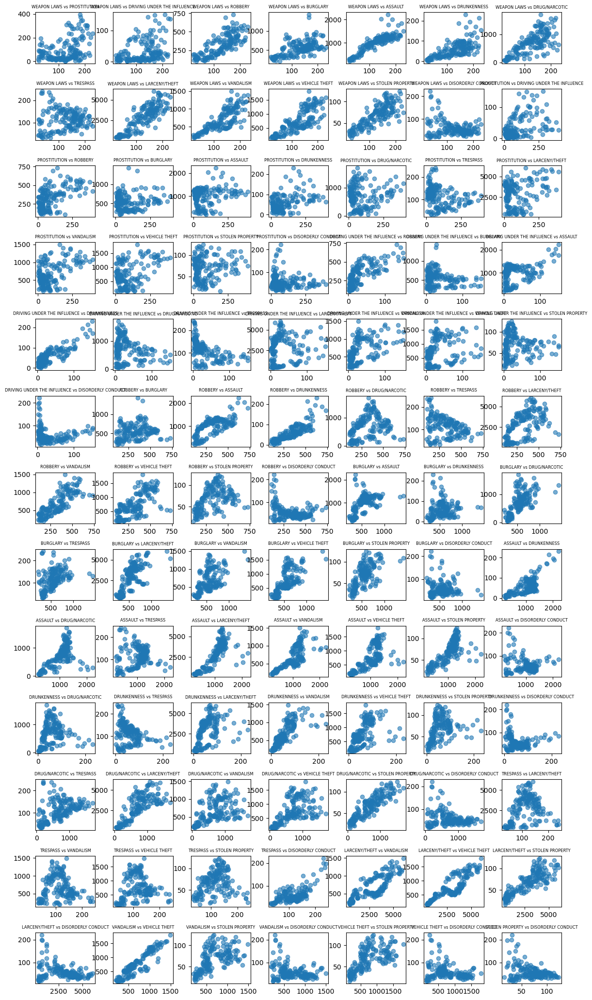

In [96]:
import matplotlib.pyplot as plt
import itertools

# Focus crimes list
focuscrimes = ['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']
pairs = list(itertools.combinations(focuscrimes, 2))

# Create a large figure to hold all subplots
fig, axes = plt.subplots(nrows=13, ncols=7, figsize=(14, 26))
fig.subplots_adjust(hspace=0.5, wspace=0.3)  # Adjust the spacing as needed

# Plot each pair in its subplot
for i, (crime1, crime2) in enumerate(pairs):
    row = i // 7
    col = i % 7
    ax = axes[row, col]
    ax.scatter(hourly_counts.loc[crime1], hourly_counts.loc[crime2], alpha=0.6)
#    ax.set_xlabel(f'{crime1} Counts', fontsize=6)
#    ax.set_ylabel(f'{crime2} Counts', fontsize=6)
    ax.set_title(f'{crime1} vs {crime2}', fontsize=6)

plt.show()


Asking Code Tutor: I would like to remove the actual numbers in the axes labels, and instead make the graphs as large as possible. I would still like to be able to see which two crimes I am comparing. Numbers themselves don't matter, only how the correlate does.

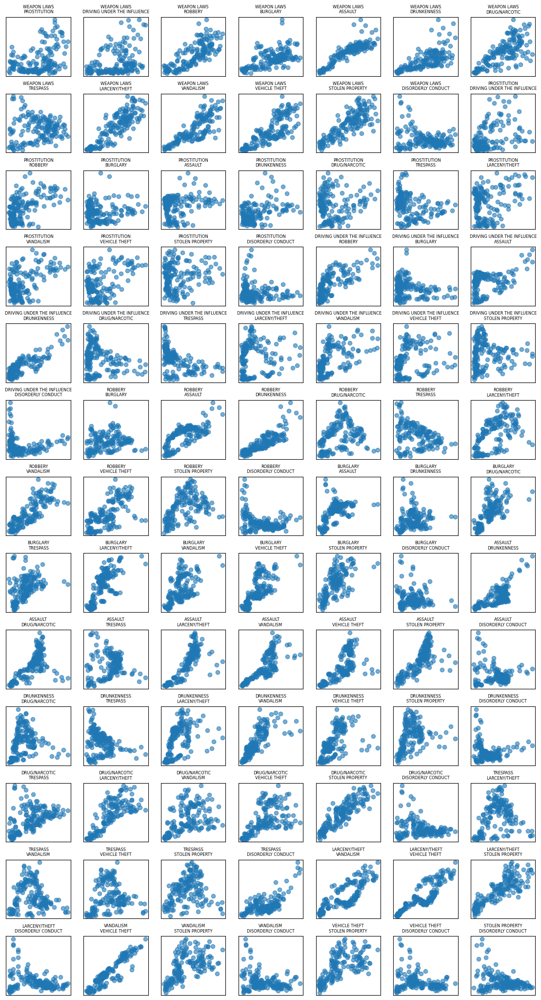

In [107]:
import matplotlib.pyplot as plt
import itertools

# Focus crimes list
focuscrimes = ['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']
pairs = list(itertools.combinations(focuscrimes, 2))

# Create a large figure to hold all subplots
fig, axes = plt.subplots(nrows=13, ncols=7, figsize=(14, 26))  # Adjust figsize for larger plots
fig.subplots_adjust(hspace=0.3, wspace=0.2)

# Define font size for titles
title_font_size = 6

# Plot each pair in its subplot
for i, (crime1, crime2) in enumerate(pairs):
    row = i // 7
    col = i % 7
    ax = axes[row, col]
    ax.scatter(hourly_counts.loc[crime1], hourly_counts.loc[crime2], alpha=0.6)
    
    # Set the title with a line break
    ax.set_title(f'{crime1}\n{crime2}', fontsize=title_font_size)
    
    # Remove the numbers from the axes
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()


(Asking Code Tutor) I would like instead of the title, to label the x and the y with their respective crime names and no title.


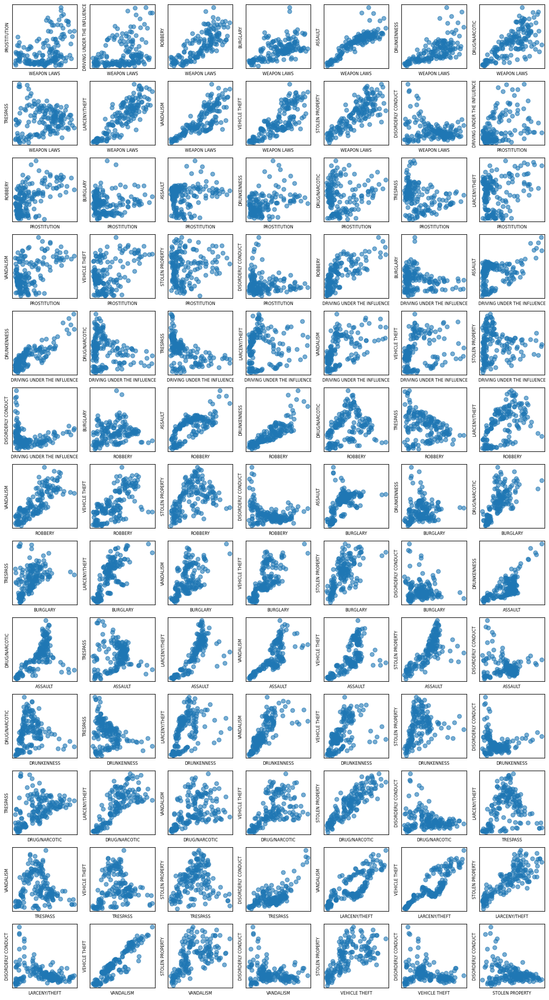

In [109]:
import matplotlib.pyplot as plt
import itertools

# Focus crimes list
focuscrimes = ['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']
pairs = list(itertools.combinations(focuscrimes, 2))

# Create a large figure to hold all subplots
fig, axes = plt.subplots(nrows=13, ncols=7, figsize=(14, 26))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

# Define font size for axis labels
axis_label_font_size = 6

# Plot each pair in its subplot
for i, (crime1, crime2) in enumerate(pairs):
    row = i // 7
    col = i % 7
    ax = axes[row, col]
    ax.scatter(hourly_counts.loc[crime1], hourly_counts.loc[crime2], alpha=0.6)
    
    # Set the x-axis and y-axis labels
    ax.set_xlabel(crime1, fontsize=axis_label_font_size)
    ax.set_ylabel(crime2, fontsize=axis_label_font_size)
    
    # Remove the numbers (ticks) from the axes
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()


Just inspecting this matrix, which crime-types look correlated and which one look like they're very different?

Correlated: 
- Veichle Theft vs Vandalism
- Veichle Theft vs Larceny Theft
- Vandalism vs Larceny Theft
- Disorderly Conduct vs Threspass
- Stolen Property vs Drug/narcotic
- Drunkness vs Vandalism
- Drunkness vs Robbery
- **Robery vs Weapon Laws**
- **Stolen Property vs Weapon Laws**
- Assault vs Weapon Laws
- **Drunkness vs Driving under the Influence**
- **Larceny Theft vs Weapon Laws**

Different: 
- Disorderly Conduct vs Drunkness and vs Driving under the influence
- Prostitution vs Weapon Laws
- Disorderly Conduct vs Vandalism vs Larceny Theft
- Veichle theft and Larceny Theft vs Prostitution
- Stolen property vs Prostitution


Next it's time for the linear regression. Janert writes about this on page 63-66.

There is a closed-form solution for linear regression. If you want to find the best straight line $y=ax+b$ fit to a set of $N$ points ${(x_1, y_1), (x_2, y_2), ..., (x_N, y_N)}$, the value of $b$ is

\begin{equation}
\tag{1}
b = \langle y \rangle - a \langle x \rangle
\end{equation}

where $\langle x \rangle = (1/N)\sum_i x_i$ is the mean value of the $x_i$ 
and $\langle y \rangle = (1/N)\sum_i y_i$ is the mean value of the $y_i$.

And the value for the slope $a$ is

\begin{equation}
\tag{2}
a = \frac{\sum_{i=1}^N (x_i y_i) - N\langle x \rangle  \langle y \rangle}{\sum_{i=1}^N \left(x_i^2 \right) - N\langle x \rangle^2}
\end{equation}

 
 

A couple of years ago, I actually derived the whole thing. I've taken it out of the notebook. But if you'd like to take a look (it's a fun and instructive little exercise), you can find it here.

We are going to focus on the fit for now, but keep in mind what we have learnt so far about the purpose of linear regression!

Exercise: Linear regression.
> Using Equation 1 and 2 above, calculate the slopes for $a$ and $b$ 
 in each case and add them to the plot. (You are free to compare the results with ones obtained using a package like sklearn to check that everything is working as expected.) *(See if you can do this by yourself without LLM help.)*

In [ ]:
from statistics import mean

avg_x = mean(x_list)        